In [2]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns

In [4]:
fce = pd.read_csv('../datasets/farm_cat_eco.csv') #fce = farm_cat_eco

In [14]:
from ydata_profiling import ProfileReport
ProfileReport(fce)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 24/24 [00:00<00:00, 394.30it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [15]:
fce.head()

,year,territory,lambs,rams,ewes,lamb_sheep_shorn,sheep_flock,sheep_purchased,cats_occurrence_total,cats_forest,...,eco_sector_authorities_stakeholders,eco_sector_environment,eco_sector_health,eco_type_control,eco_type_control_education,eco_type_control_medical_care,eco_type_control_prevention,eco_type_damage_loss,eco_type_eradication,eco_type_prevention
0,2002,All Australia,10658.0,662.0,26531.0,51883.0,47861.0,3300.0,197.0,77.0,...,825276.359414,0.0,0.0,825276.359414,0.0,0.0,0.0,0.0,0.0,0.0
1,2002,New South Wales,2624.0,131.0,5996.0,11360.0,10544.0,770.0,104.0,46.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2002,Northern Territory,0.0,0.0,0.0,0.0,0.0,0.0,34.0,2.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2002,Queensland,1421.0,103.0,5020.0,11123.0,9707.0,584.0,24.0,17.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2002,South Australia,2148.0,137.0,5372.0,8857.0,8938.0,692.0,18.0,4.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [16]:
fce.info

<bound method DataFrame.info of      year           territory    lambs   rams     ewes  lamb_sheep_shorn  \
0    2002       All Australia  10658.0  662.0  26531.0           51883.0   
1    2002     New South Wales   2624.0  131.0   5996.0           11360.0   
2    2002  Northern Territory      0.0    0.0      0.0               0.0   
3    2002          Queensland   1421.0  103.0   5020.0           11123.0   
4    2002     South Australia   2148.0  137.0   5372.0            8857.0   
..    ...                 ...      ...    ...      ...               ...   
174  2022          Queensland   1056.0   59.0   2039.0            3267.0   
175  2022     South Australia   3003.0  123.0   5280.0            9578.0   
176  2022            Tasmania    567.0   20.0   1029.0            1804.0   
177  2022            Victoria   1608.0   50.0   2272.0            4236.0   
178  2022   Western Australia   1905.0   82.0   3224.0            6344.0   

     sheep_flock  sheep_purchased  cats_occurrence_tota

In [17]:
fce.dtypes

year                                     int64
territory                               object
lambs                                  float64
rams                                   float64
ewes                                   float64
lamb_sheep_shorn                       float64
sheep_flock                            float64
sheep_purchased                        float64
cats_occurrence_total                  float64
cats_forest                            float64
eco_cost_total                         float64
eco_cost_cat_only                      float64
eco_cost_cat_plus_other                float64
eco_sector_agriculture                 float64
eco_sector_authorities_stakeholders    float64
eco_sector_environment                 float64
eco_sector_health                      float64
eco_type_control                       float64
eco_type_control_education             float64
eco_type_control_medical_care          float64
eco_type_control_prevention            float64
eco_type_dama

In [5]:
fce['cats_nonforest'] = fce['cats_occurrence_total'] - fce['cats_forest']
fce['cats_nonforest']

0      120.0
1       58.0
2       32.0
3        7.0
4       14.0
       ...  
174     62.0
175    136.0
176     73.0
177     67.0
178     51.0
Name: cats_nonforest, Length: 179, dtype: float64

In [6]:
corr = fce[['sheep_flock', 'cats_occurrence_total', 'rams', 'ewes', 'cats_nonforest', 'sheep_purchased']].corr()
corr.style.background_gradient(cmap='BuPu')

,sheep_flock,cats_occurrence_total,rams,ewes,cats_nonforest,sheep_purchased
sheep_flock,1.000000,0.609361,0.888219,0.894446,0.693851,0.949133
cats_occurrence_total,0.609361,1.000000,0.641141,0.662833,0.869734,0.494872
rams,0.888219,0.641141,1.000000,0.993576,0.710633,0.821213
ewes,0.894446,0.662833,0.993576,1.000000,0.730249,0.828589
cats_nonforest,0.693851,0.869734,0.710633,0.730249,1.000000,0.584091
sheep_purchased,0.949133,0.494872,0.821213,0.828589,0.584091,1.000000


In [10]:
# Top sheep states
sheep_states = ['New South Wales', 'Western Australia', 'South Australia', 'Victoria']
sheep_df = fce[fce['territory'].isin(sheep_states)]

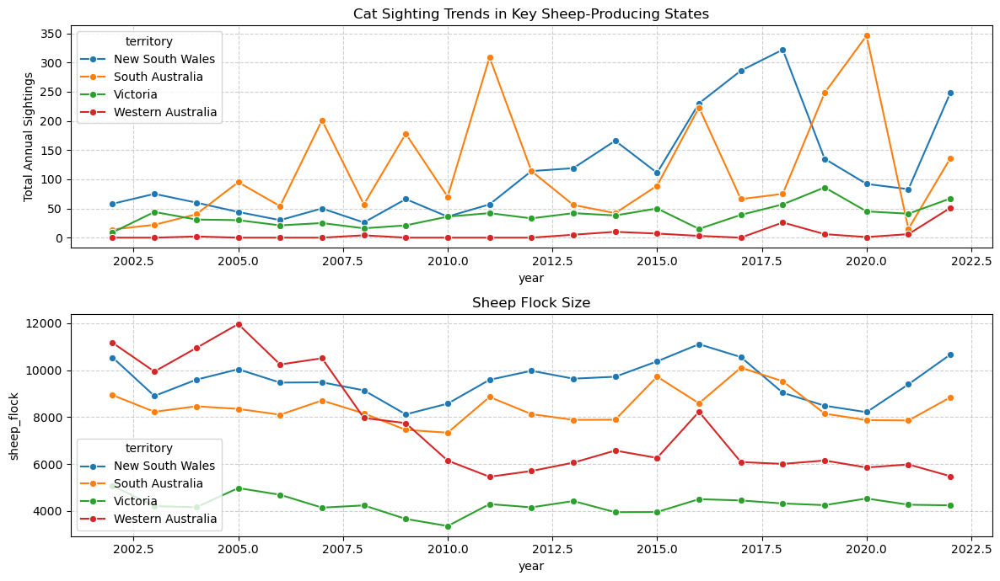

In [13]:
fig, ax = plt.subplots(2, 1, figsize=(12, 7))
# Sheep regions only and sum occurrences by year
trend_df = sheep_df.groupby(['year', 'territory'])['cats_nonforest'].sum().reset_index()
trend_df2 = sheep_df.groupby(['year', 'territory'])['sheep_flock'].sum().reset_index()

sns.lineplot(data=trend_df, x='year', y='cats_nonforest', hue='territory', marker='o', ax=ax[0])
ax[0].set_title('Cat Sighting Trends in Key Sheep-Producing States')
ax[0].set_ylabel('Total Annual Sightings')
ax[0].grid(True, linestyle='--', alpha=0.6)

sns.lineplot(data=trend_df2, x='year', y='sheep_flock', hue='territory', marker='o', ax=ax[1])
ax[1].set_title('Sheep Flock Size')
ax[1].grid(True, linestyle='--', alpha=0.6)

plt.tight_layout()
plt.show()

## Normalize cat nonforest and sheep flock to compare trends

In [16]:
trend_df['cats_scaled'] = (
    trend_df.groupby('territory')['cats_nonforest']
    .transform(lambda x: (x - x.min()) / (x.max() - x.min()))
)

trend_df2['sheep_scaled'] = (
    trend_df2.groupby('territory')['sheep_flock']
    .transform(lambda x: (x - x.min()) / (x.max() - x.min()))
)

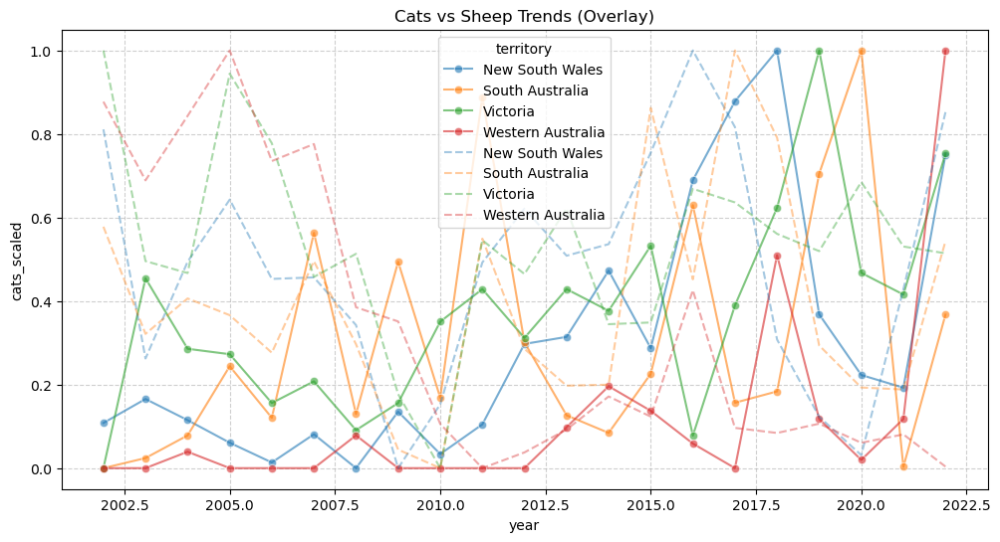

In [17]:
plt.figure(figsize=(12, 6))

sns.lineplot(
    data=trend_df,
    x='year',
    y='cats_scaled',
    hue='territory',
    marker='o',
    alpha=0.6
)

sns.lineplot(
    data=trend_df2,
    x='year',
    y='sheep_scaled',
    hue='territory',
    linestyle='--',
    alpha=0.4
)

plt.title('Cats vs Sheep Trends (Overlay)')
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()


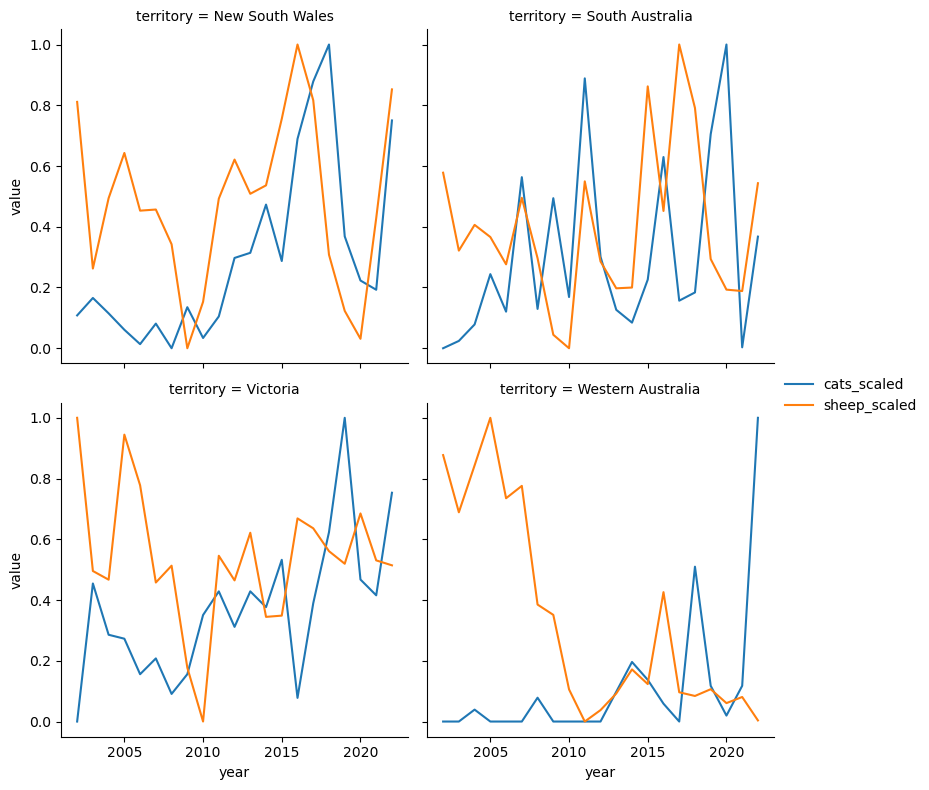

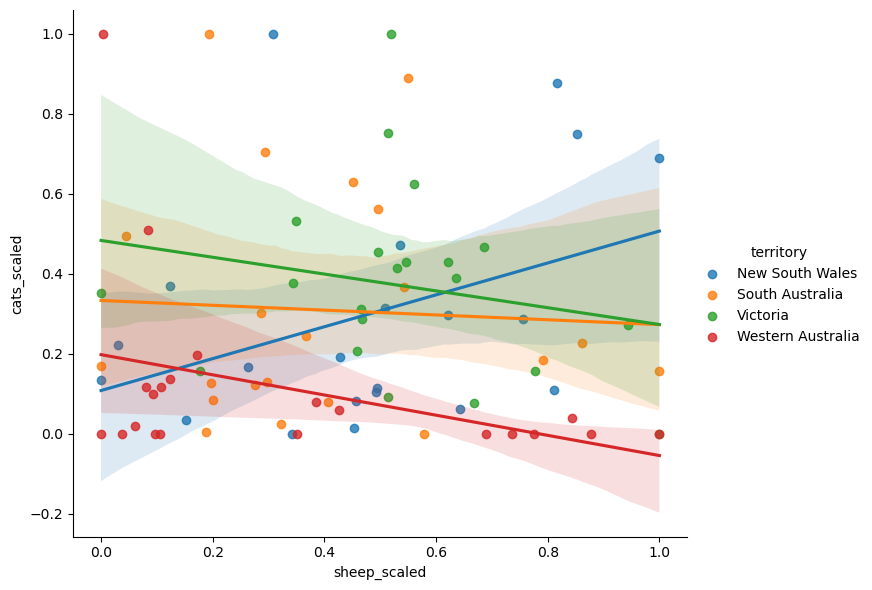

In [22]:
# Merge scaled datasets first
merged = trend_df[['year', 'territory', 'cats_scaled']].merge(
    trend_df2[['year', 'territory', 'sheep_scaled']],
    on=['year', 'territory']
)

# Melt to long format
plot_df = merged.melt(
    id_vars=['year', 'territory'],
    value_vars=['cats_scaled', 'sheep_scaled'],
    var_name='variable',
    value_name='value'
)

g = sns.FacetGrid(plot_df, col='territory', col_wrap=2, height=4, sharey=True)
g.map_dataframe(sns.lineplot, x='year', y='value', hue='variable')
g.add_legend()


sns.lmplot(
    data=merged,
    x='sheep_scaled',
    y='cats_scaled',
    hue='territory',
    height=6,
    aspect=1.2
)
